In [1]:
import pandas as pd

In [2]:
def_df = pd.read_csv("/Users/alyssaliu/Desktop/StatsM148/Event Definitions.csv")
df = pd.read_csv("/Users/alyssaliu/Desktop/StatsM148/export.csv")

In [3]:
def_df

,event_name,journey_id,event_definition_id,milestone_number,stage
0,application_phone_approved,1,15,1.0,Apply for Credit
1,application_phone_declined,1,16,NaN,Apply for Credit
2,application_phone_pending,1,17,NaN,Apply for Credit
3,application_web_approved,1,12,1.0,Apply for Credit
4,application_web_declined,1,13,NaN,Apply for Credit
5,application_web_pending,1,14,NaN,Apply for Credit
6,application_web_submit,1,3,NaN,Apply for Credit
7,application_web_view,1,19,NaN,Apply for Credit
8,account_activitation,1,29,3.0,Credit Account
9,account_fraud_review,1,37,NaN,Credit Account


In [4]:
df.head() 

,customer_id,account_id,ed_id,event_name,event_timestamp,journey_steps_until_end
0,-784961211,1773350293,12,application_web_approved,2023-03-22T08:45:22.000Z,1
1,-784961211,1773350293,19,application_web_view,2023-03-22T13:32:10.000Z,2
2,-784961211,1773350293,19,application_web_view,2023-03-22T13:32:10.000Z,3
3,-784961211,1773350293,19,application_web_view,2023-03-22T13:32:10.000Z,4
4,-784961211,1773350293,19,application_web_view,2023-03-22T13:32:10.000Z,5


In [5]:
import datetime
from matplotlib import pyplot as plt
import seaborn as sns

In [6]:
df['event_timestamp'] = pd.to_datetime(df['event_timestamp'])

In [7]:
df.head()

,customer_id,account_id,ed_id,event_name,event_timestamp,journey_steps_until_end
0,-784961211,1773350293,12,application_web_approved,2023-03-22 08:45:22+00:00,1
1,-784961211,1773350293,19,application_web_view,2023-03-22 13:32:10+00:00,2
2,-784961211,1773350293,19,application_web_view,2023-03-22 13:32:10+00:00,3
3,-784961211,1773350293,19,application_web_view,2023-03-22 13:32:10+00:00,4
4,-784961211,1773350293,19,application_web_view,2023-03-22 13:32:10+00:00,5


In [8]:
monthly_df = df.resample('M', on = 'event_timestamp')

In [9]:
unique_cust = monthly_df['customer_id'].nunique()
unique_acct = monthly_df['account_id'].nunique()

In [10]:
purchased_df = df[df['ed_id'].isin([11, 6, 4, 18, 7, 5])] # first purchase IDs
purchase_cust_df = purchased_df.resample('M', on = 'event_timestamp')['customer_id'].nunique()
purchase_cust_df

event_timestamp
2020-11-30 00:00:00+00:00       492
2020-12-31 00:00:00+00:00      1544
2021-01-31 00:00:00+00:00     56437
2021-02-28 00:00:00+00:00     77488
2021-03-31 00:00:00+00:00    106237
2021-04-30 00:00:00+00:00    107412
2021-05-31 00:00:00+00:00    104240
2021-06-30 00:00:00+00:00     95391
2021-07-31 00:00:00+00:00     92667
2021-08-31 00:00:00+00:00     86467
2021-09-30 00:00:00+00:00     83481
2021-10-31 00:00:00+00:00    112708
2021-11-30 00:00:00+00:00    142705
2021-12-31 00:00:00+00:00    113587
2022-01-31 00:00:00+00:00     74559
2022-02-28 00:00:00+00:00     70985
2022-03-31 00:00:00+00:00     72833
2022-04-30 00:00:00+00:00     71067
2022-05-31 00:00:00+00:00     80624
2022-06-30 00:00:00+00:00     68079
2022-07-31 00:00:00+00:00     60356
2022-08-31 00:00:00+00:00     57615
2022-09-30 00:00:00+00:00     57176
2022-10-31 00:00:00+00:00     69069
2022-11-30 00:00:00+00:00     93373
2022-12-31 00:00:00+00:00    106722
2023-01-31 00:00:00+00:00     55352
2023-02-28 0

In [11]:
credit_df = df[df['ed_id'].isin([15, 16, 17, 12, 13, 14, 3, 19])] # applied for credit IDs
app_credit_df = credit_df.resample('M', on = 'event_timestamp')['customer_id'].nunique()
app_credit_df

event_timestamp
2020-11-30 00:00:00+00:00       355
2020-12-31 00:00:00+00:00      1363
2021-01-31 00:00:00+00:00     73259
2021-02-28 00:00:00+00:00     75124
2021-03-31 00:00:00+00:00     91822
2021-04-30 00:00:00+00:00     85417
2021-05-31 00:00:00+00:00     82533
2021-06-30 00:00:00+00:00     71871
2021-07-31 00:00:00+00:00     63676
2021-08-31 00:00:00+00:00     55575
2021-09-30 00:00:00+00:00     57135
2021-10-31 00:00:00+00:00     88614
2021-11-30 00:00:00+00:00    100691
2021-12-31 00:00:00+00:00     57774
2022-01-31 00:00:00+00:00     45209
2022-02-28 00:00:00+00:00     44954
2022-03-31 00:00:00+00:00     40535
2022-04-30 00:00:00+00:00     55315
2022-05-31 00:00:00+00:00     63907
2022-06-30 00:00:00+00:00     47777
2022-07-31 00:00:00+00:00     43957
2022-08-31 00:00:00+00:00     39646
2022-09-30 00:00:00+00:00     42033
2022-10-31 00:00:00+00:00     54477
2022-11-30 00:00:00+00:00     76089
2022-12-31 00:00:00+00:00     76747
2023-01-31 00:00:00+00:00     40660
2023-02-28 0

In [12]:
credit_acct_df = df[df['ed_id'].isin([29, 37])] # credit acct
credit_acct_df = credit_acct_df.resample('M', on = 'event_timestamp')['customer_id'].nunique()

In [13]:
downpayment_df = df[df['ed_id'].isin([27, 26, 8, 25])] # downpayment
downpayment_count_df = downpayment_df.resample('M', on = 'event_timestamp')['customer_id'].nunique()

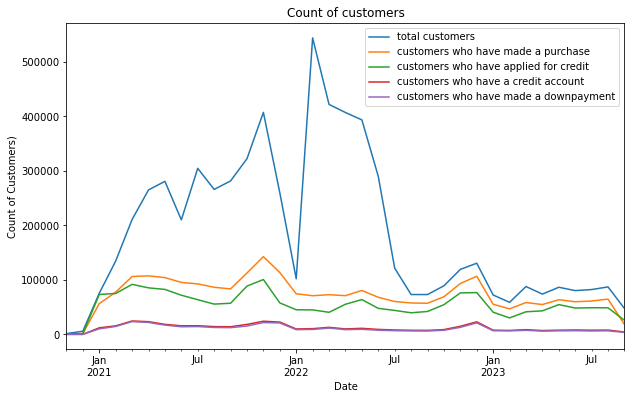

In [14]:
plt.figure(figsize=(10, 6))
unique_cust.plot(label = 'total customers')
purchase_cust_df.plot(label = 'customers who have made a purchase')
app_credit_df.plot(label = 'customers who have applied for credit')
credit_acct_df.plot(label = 'customers who have a credit account')
downpayment_count_df.plot(label = 'customers who have made a downpayment')
plt.title("Count of customers")
plt.ylabel("Count of Customers)")
plt.xlabel("Date")
plt.legend()
plt.show()

In [36]:
max_journey = monthly_df['journey_steps_until_end'].max()
mode_event = monthly_df['ed_id'].agg(lambda x: x.mode().iloc[0])

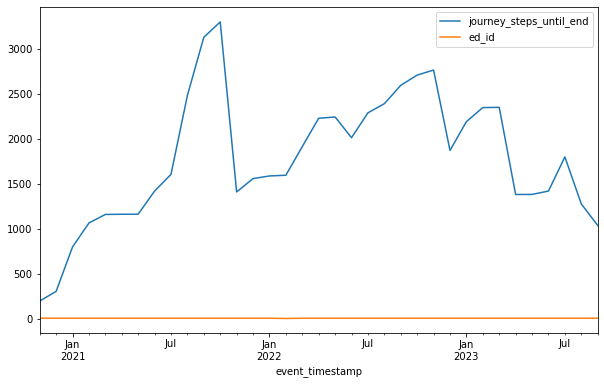

In [32]:
plt.figure(figsize=(10, 6))
max_journey.plot()
mode_event.plot()
plt.legend()
plt.show()

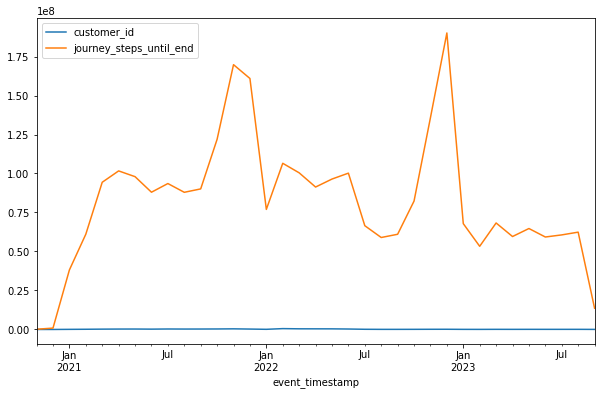

In [35]:
plt.figure(figsize=(10, 6))
unique_cust.plot()
max_journey.plot()
plt.legend()
plt.show()

In [40]:
grouped_event = df.groupby('event_name').nunique()

In [41]:
total_journey = df.groupby('event_name')['journey_steps_until_end'].sum()

In [44]:
df_counts = df.resample('M', on = 'event_timestamp').size()

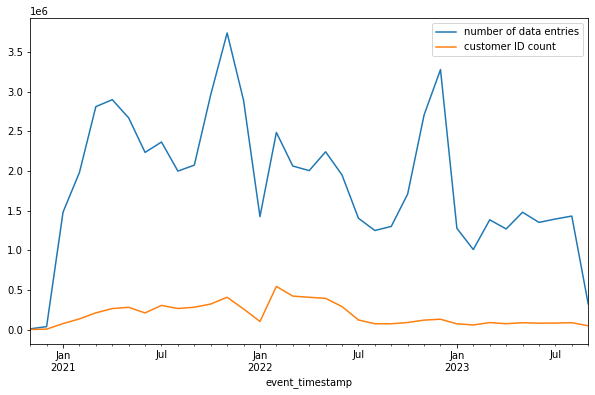

In [49]:
plt.figure(figsize=(10, 6))
df_counts.plot(label = "number of data entries")
unique_cust.plot(label = "customer ID count")
plt.legend()
plt.show()

In [ ]:
for index, row in df.iterrows():
    print(index, row['ed_id'])

0 12
1 19
2 19
3 19
4 19
5 19
6 19
7 19
8 19
9 19
10 19
11 19
12 19
13 19
14 3
15 2
16 19
17 19
18 19
19 19
20 19
21 19
22 19
23 19
24 4
25 4
26 4
27 4
28 4
29 2
30 4
31 4
32 19
33 19
34 19
35 19
36 19
37 3
38 12
39 4
40 4
41 4
42 11
43 4
44 5
45 5
46 4
47 4
48 4
49 4
50 4
51 4
52 4
53 4
54 4
55 4
56 4
57 4
58 4
59 4
60 4
61 4
62 4
63 4
64 4
65 5
66 5
67 4
68 4
69 4
70 4
71 4
72 4
73 4
74 4
75 4
76 1
77 4
78 4
79 4
80 4
81 4
82 4
83 4
84 11
85 5
86 4
87 5
88 4
89 4
90 4
91 4
92 4
93 4
94 4
95 4
96 4
97 4
98 4
99 4
100 4
101 4
102 4
103 4
104 4
105 4
106 4
107 1
108 1
109 1
110 1
111 2
112 12
113 3
114 19
115 19
116 19
117 19
118 19
119 19
120 19
121 19
122 19
123 19
124 19
125 19
126 19
127 19
128 19
129 19
130 3
131 19
132 12
133 19
134 19
135 19
136 19
137 19
138 19
139 19
140 1
141 1
142 1
143 1
144 12
145 4
146 4
147 4
148 4
149 3
150 19
151 19
152 19
153 19
154 19
155 19
156 19
157 19
158 19
159 19
160 19
161 19
162 19
163 19
164 19
165 19
166 19
167 19
168 19
169 19
170 19
171 19